# Modelo de predicción de calidad de mineral de hierro en un proceso de minería

> ### El objetivo del modelo es predecir la concentración de sílice en el mineral al final de un proceso de extracción para saber su pureza

### Importo las librerías

In [1]:
import pickle
from datetime import datetime
import pandas as pd
import numpy as np
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
import re
import time
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

In [2]:
Data = pd.read_csv("https://media.githubusercontent.com/media/Toni2Morales/MachineLearning/main/scr/data/Data.csv", index_col="Unnamed: 0")

In [458]:
Data.head(7)

,% Iron Feed,% Silica Feed,Starch Flow,Amina Flow,Ore Pulp Flow,Ore Pulp pH,Ore Pulp Density,Flotation Column 01 Air Flow,Flotation Column 04 Air Flow,Flotation Column 05 Air Flow,Flotation Column 06 Air Flow,Flotation Column 01 Level,Flotation Column 02 Level,Flotation Column 03 Level,Flotation Column 04 Level,Flotation Column 05 Level,Flotation Column 06 Level,Flotation Column 07 Level,% Silica Concentrate
0,55.2,16.98,3019.53,557.434,395.713,10.0664,1.74,249.214,295.096,306.4,250.225,457.396,432.962,424.954,443.558,502.255,446.370,523.344,1.31
1,55.2,16.98,3024.41,563.965,397.383,10.0672,1.74,249.719,295.096,306.4,250.137,451.891,429.560,432.939,448.086,496.363,445.922,498.075,1.31
2,55.2,16.98,3043.46,568.054,399.668,10.0680,1.74,249.741,295.096,306.4,251.345,451.240,468.927,434.610,449.688,484.411,447.826,458.567,1.31
3,55.2,16.98,3047.36,568.665,397.939,10.0689,1.74,249.917,295.096,306.4,250.422,452.441,458.165,442.865,446.210,471.411,437.690,427.669,1.31
4,55.2,16.98,3033.69,558.167,400.254,10.0697,1.74,250.203,295.096,306.4,249.983,452.441,452.900,450.523,453.670,462.598,443.682,425.679,1.31
5,55.2,16.98,3079.10,564.697,396.533,10.0705,1.74,250.730,295.096,306.4,250.356,444.384,443.269,460.449,439.920,451.588,433.539,425.458,1.31
6,55.2,16.98,3127.79,566.467,392.900,10.0713,1.74,250.313,295.096,306.4,250.950,446.185,444.571,452.306,431.328,443.548,444.575,431.251,1.31


In [134]:
Data.tail()

,% Iron Feed,% Silica Feed,Starch Flow,Amina Flow,Ore Pulp Flow,Ore Pulp pH,Ore Pulp Density,Flotation Column 01 Air Flow,Flotation Column 02 Air Flow,Flotation Column 03 Air Flow,...,Flotation Column 07 Air Flow,Flotation Column 01 Level,Flotation Column 02 Level,Flotation Column 03 Level,Flotation Column 04 Level,Flotation Column 05 Level,Flotation Column 06 Level,Flotation Column 07 Level,% Iron Concentrate,% Silica Concentrate
737448,49.75,23.2,2710.94,441.052,386.570,9.62129,1.65365,302.344,298.786,299.163,...,313.695,392.160,430.702,872.008,418.725,497.548,446.357,416.892,64.27,1.71
737449,49.75,23.2,2692.01,473.436,384.939,9.62063,1.65352,303.013,301.879,299.487,...,236.700,401.505,404.616,864.409,418.377,506.398,372.995,426.337,64.27,1.71
737450,49.75,23.2,2692.20,500.488,383.496,9.61874,1.65338,303.662,307.397,299.487,...,225.879,408.899,399.316,867.598,419.531,503.414,336.035,433.130,64.27,1.71
737451,49.75,23.2,1164.12,491.548,384.976,9.61686,1.65324,302.550,301.959,298.045,...,308.115,405.107,466.832,876.591,407.299,502.301,340.844,433.966,64.27,1.71
737452,49.75,23.2,1164.12,468.019,384.801,9.61497,1.65310,300.355,292.865,298.625,...,308.115,413.754,514.143,881.323,378.969,500.100,374.354,441.182,64.27,1.71


In [135]:
Data.shape

(737453, 23)

In [136]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 737453 entries, 0 to 737452
Data columns (total 23 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   % Iron Feed                   737453 non-null  float64
 1   % Silica Feed                 737453 non-null  float64
 2   Starch Flow                   737453 non-null  float64
 3   Amina Flow                    737453 non-null  float64
 4   Ore Pulp Flow                 737453 non-null  float64
 5   Ore Pulp pH                   737453 non-null  float64
 6   Ore Pulp Density              737453 non-null  float64
 7   Flotation Column 01 Air Flow  737453 non-null  float64
 8   Flotation Column 02 Air Flow  737453 non-null  float64
 9   Flotation Column 03 Air Flow  737453 non-null  float64
 10  Flotation Column 04 Air Flow  737453 non-null  float64
 11  Flotation Column 05 Air Flow  737453 non-null  float64
 12  Flotation Column 06 Air Flow  737453 non-nul

In [137]:
Data.describe()

,% Iron Feed,% Silica Feed,Starch Flow,Amina Flow,Ore Pulp Flow,Ore Pulp pH,Ore Pulp Density,Flotation Column 01 Air Flow,Flotation Column 02 Air Flow,Flotation Column 03 Air Flow,...,Flotation Column 07 Air Flow,Flotation Column 01 Level,Flotation Column 02 Level,Flotation Column 03 Level,Flotation Column 04 Level,Flotation Column 05 Level,Flotation Column 06 Level,Flotation Column 07 Level,% Iron Concentrate,% Silica Concentrate
count,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,...,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000,737453.000000
mean,56.294739,14.651716,2869.140569,488.144697,397.578372,9.767639,1.680380,280.151856,277.159965,281.082397,...,290.754856,520.244823,522.649555,531.352662,420.320973,425.251706,429.941018,421.021231,65.050068,2.326763
std,5.157744,6.807439,1215.203734,91.230534,9.699785,0.387007,0.069249,29.621288,30.149357,28.558268,...,28.670105,131.014924,128.165050,150.842164,91.794432,84.535822,89.862225,84.891491,1.118645,1.125554
min,42.740000,1.310000,0.002026,241.669000,376.249000,8.753340,1.519820,175.510000,175.156000,176.469000,...,185.962000,149.218000,210.752000,126.255000,162.201000,166.991000,155.841000,175.349000,62.050000,0.600000
25%,52.670000,8.940000,2076.320000,431.796000,394.264000,9.527360,1.647310,250.281000,250.457000,250.855000,...,256.302000,416.978000,441.883000,411.325000,356.679000,357.653000,358.497000,356.772000,64.370000,1.440000
50%,56.080000,13.850000,3018.430000,504.393000,399.249000,9.798100,1.697600,299.344000,296.223000,298.696000,...,299.011000,491.878000,495.956000,494.318000,411.974000,408.773000,424.664575,411.065000,65.210000,2.000000
75%,59.720000,19.600000,3727.730000,553.257000,402.968000,10.038000,1.728330,300.149000,300.690000,300.382000,...,301.904000,594.114000,595.464000,601.249000,485.549000,484.329000,492.684000,476.465000,65.860000,3.010000
max,65.780000,33.400000,6300.230000,739.538000,418.641000,10.808100,1.853250,373.871000,375.992000,364.346000,...,371.593000,862.274000,828.919000,886.822000,680.359000,675.644000,698.861000,659.902000,68.010000,5.530000


## Realizo gráficos para entender las distribuciones y relaciones entre las variables predictoras y la variable target

c:\Users\tonim\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

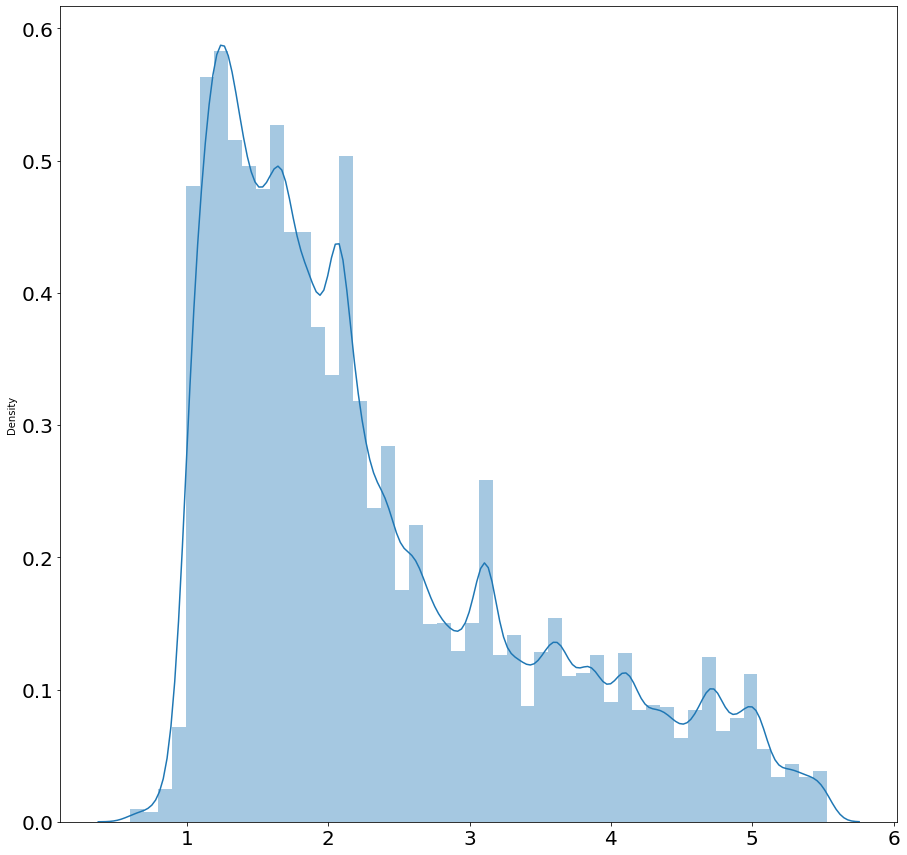

In [51]:
plt.figure(figsize = (15,15))
sns.distplot(x = Data["% Silica Concentrate"])
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)

In [139]:
Data.columns

Index(['% Iron Feed', '% Silica Feed', 'Starch Flow', 'Amina Flow',
       'Ore Pulp Flow', 'Ore Pulp pH', 'Ore Pulp Density',
       'Flotation Column 01 Air Flow', 'Flotation Column 02 Air Flow',
       'Flotation Column 03 Air Flow', 'Flotation Column 04 Air Flow',
       'Flotation Column 05 Air Flow', 'Flotation Column 06 Air Flow',
       'Flotation Column 07 Air Flow', 'Flotation Column 01 Level',
       'Flotation Column 02 Level', 'Flotation Column 03 Level',
       'Flotation Column 04 Level', 'Flotation Column 05 Level',
       'Flotation Column 06 Level', 'Flotation Column 07 Level',
       '% Iron Concentrate', '% Silica Concentrate'],
      dtype='object')

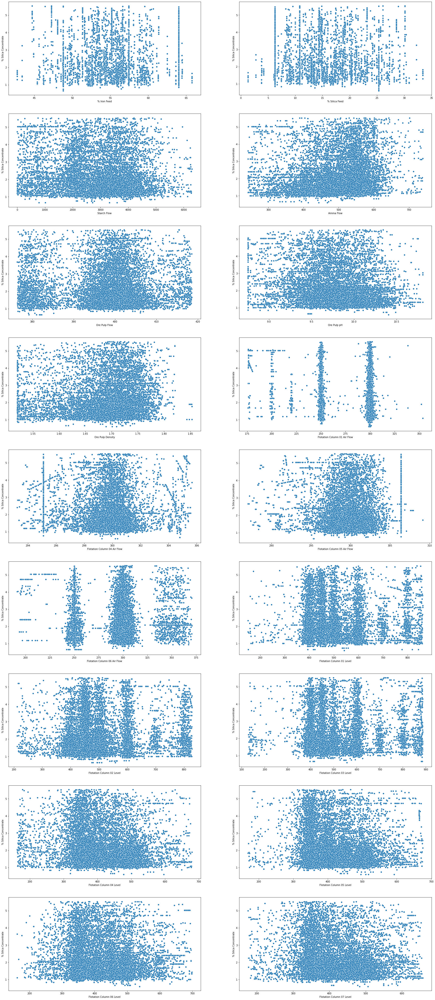

In [140]:
fig = plt.figure()

for i in range(1,19):
        fig.add_subplot(9, 2, i)
        sns.scatterplot(data = Data.sample(10000), 
        x = ['% Iron Feed', '% Silica Feed','Starch Flow', 'Amina Flow',
        'Ore Pulp Flow', 'Ore Pulp pH', 'Ore Pulp Density',
        'Flotation Column 01 Air Flow', 'Flotation Column 04 Air Flow',
        'Flotation Column 05 Air Flow', 'Flotation Column 06 Air Flow',
        'Flotation Column 01 Level', 'Flotation Column 02 Level',
        'Flotation Column 03 Level', 'Flotation Column 04 Level',
        'Flotation Column 05 Level', 'Flotation Column 06 Level',
        'Flotation Column 07 Level'][i-1], 
        y ="% Silica Concentrate")
    
plt.subplots_adjust(left=1,
                    bottom=1, 
                    right=5, 
                    top=15, 
                    wspace=0.2)

(array([0., 1., 2., 3., 4., 5., 6.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

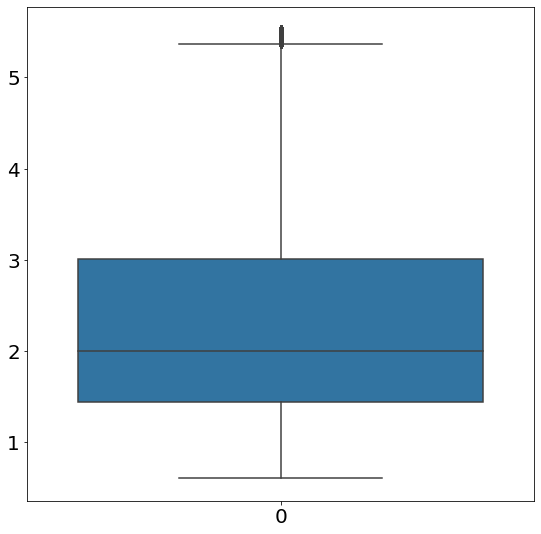

In [54]:
plt.figure(figsize = (20,20))
plt.subplot(2,2,1)
sns.boxplot(data = Data["% Silica Concentrate"])
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)

Text(0.5, 0, '% Silica Feed')

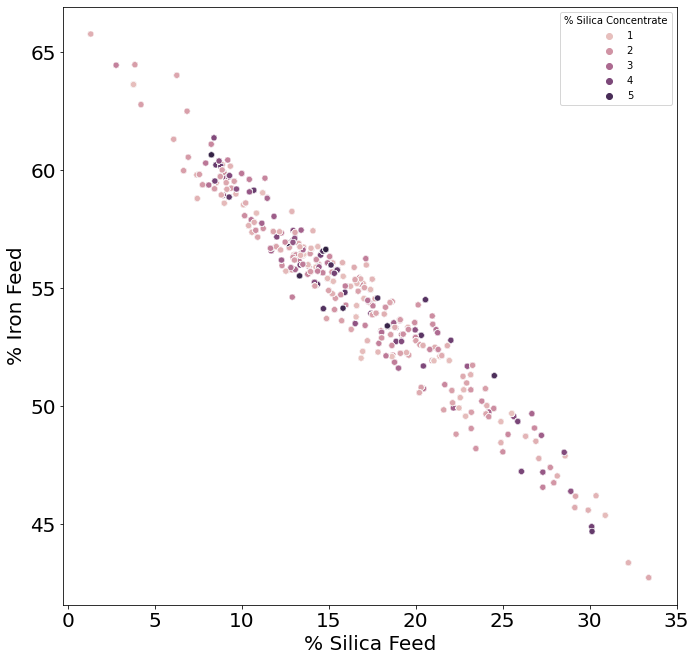

In [59]:
plt.figure(figsize = (11,11))
sns.scatterplot(data = Data, x = "% Silica Feed", y = "% Iron Feed", hue = "% Silica Concentrate")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylabel("% Iron Feed", fontsize = 20)
plt.xlabel("% Silica Feed", fontsize = 20)

Text(0.5, 0, '% Silica Concentrate')

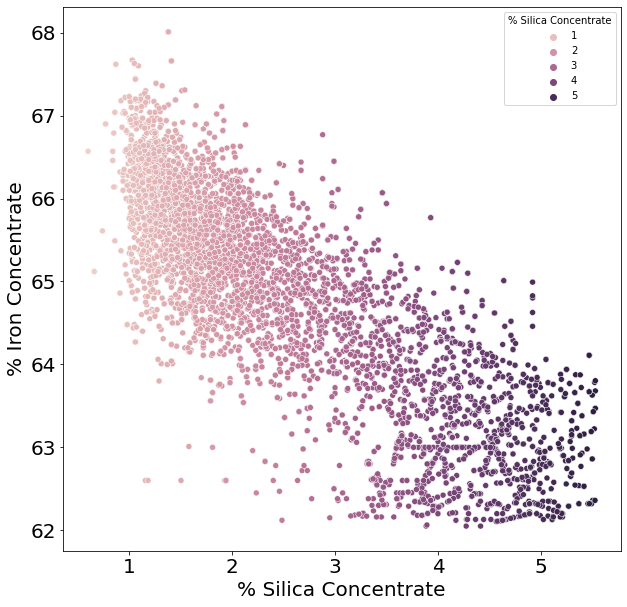

In [60]:
plt.figure(figsize = (10,10))
sns.scatterplot(data = Data.sample(10000), x = "% Silica Concentrate", y = "% Iron Concentrate", hue = "% Silica Concentrate")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylabel("% Iron Concentrate", fontsize = 20)
plt.xlabel("% Silica Concentrate", fontsize = 20)

Text(0, 0.5, '% Silica Feed')

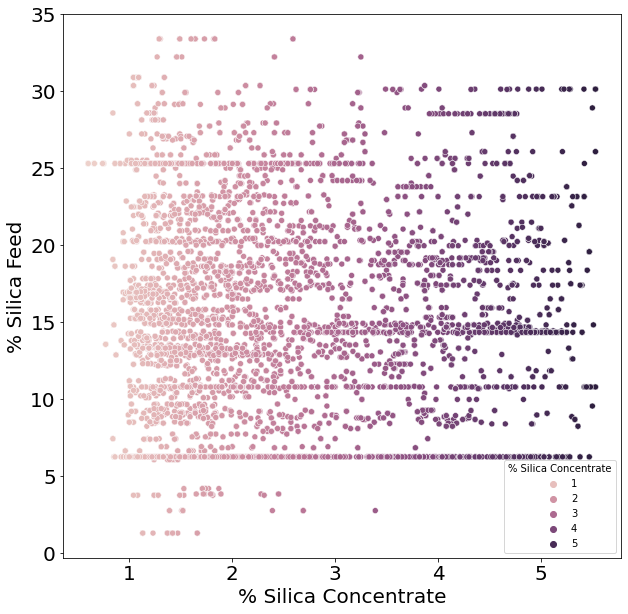

In [71]:
plt.figure(figsize = (10,10))
sns.scatterplot(data = Data.sample(10000), x = "% Silica Concentrate", y = "% Silica Feed", hue = "% Silica Concentrate")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("% Silica Concentrate", fontsize = 20)
plt.ylabel("% Silica Feed", fontsize = 20)

Text(0, 0.5, '% Iron Feed')

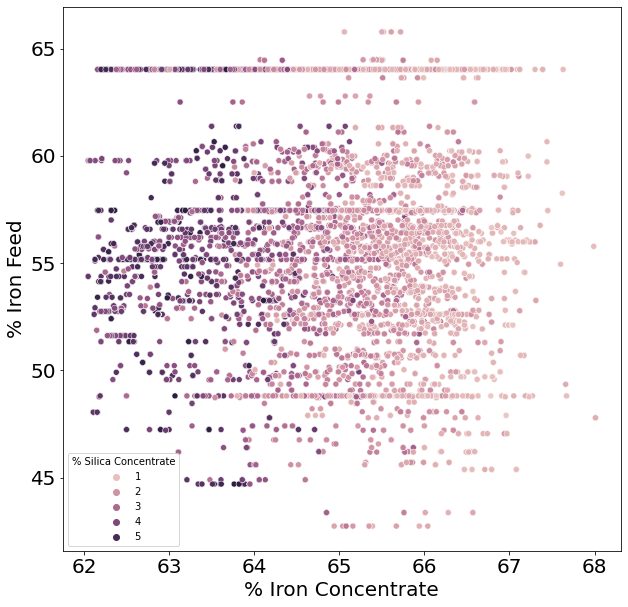

In [74]:
plt.figure(figsize = (10,10))
sns.scatterplot(data = Data.sample(10000), x = "% Iron Concentrate", y = "% Iron Feed", hue = "% Silica Concentrate")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("% Iron Concentrate", fontsize = 20)
plt.ylabel("% Iron Feed", fontsize = 20)

<AxesSubplot:>

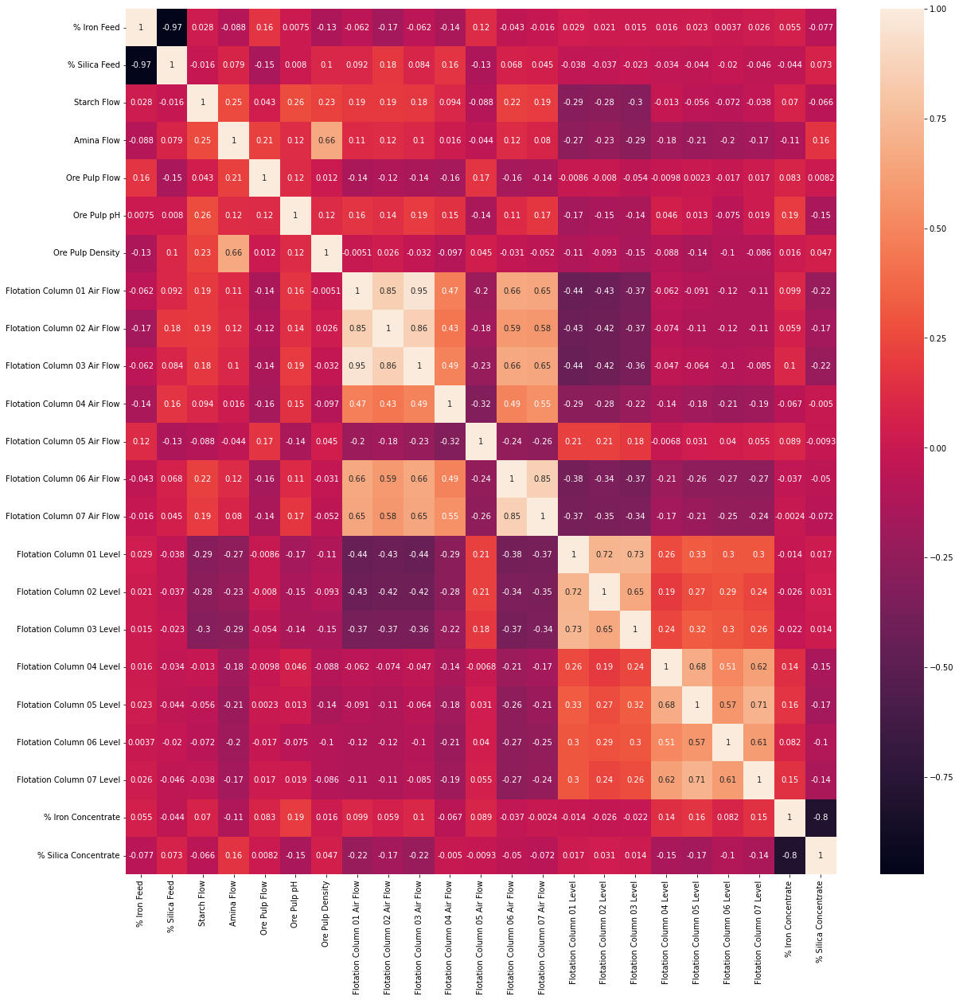

In [67]:
plt.figure(figsize = (20, 20))
sns.heatmap(Data.corr(), annot = True)

In [75]:
Data.corr()[(Data.corr() > 0.8) & (Data.corr() != 1)].dropna(axis = 1, how = "all").dropna(axis = 0, how = "all")

,Flotation Column 01 Air Flow,Flotation Column 02 Air Flow,Flotation Column 03 Air Flow,Flotation Column 06 Air Flow,Flotation Column 07 Air Flow
Flotation Column 01 Air Flow,NaN,0.848277,0.954528,NaN,NaN
Flotation Column 02 Air Flow,0.848277,NaN,0.860438,NaN,NaN
Flotation Column 03 Air Flow,0.954528,0.860438,NaN,NaN,NaN
Flotation Column 06 Air Flow,NaN,NaN,NaN,NaN,0.854067
Flotation Column 07 Air Flow,NaN,NaN,NaN,0.854067,NaN


In [3]:
Data.drop(columns = ["Flotation Column 07 Air Flow", "Flotation Column 02 Air Flow", "Flotation Column 03 Air Flow", "% Iron Concentrate"], inplace = True)

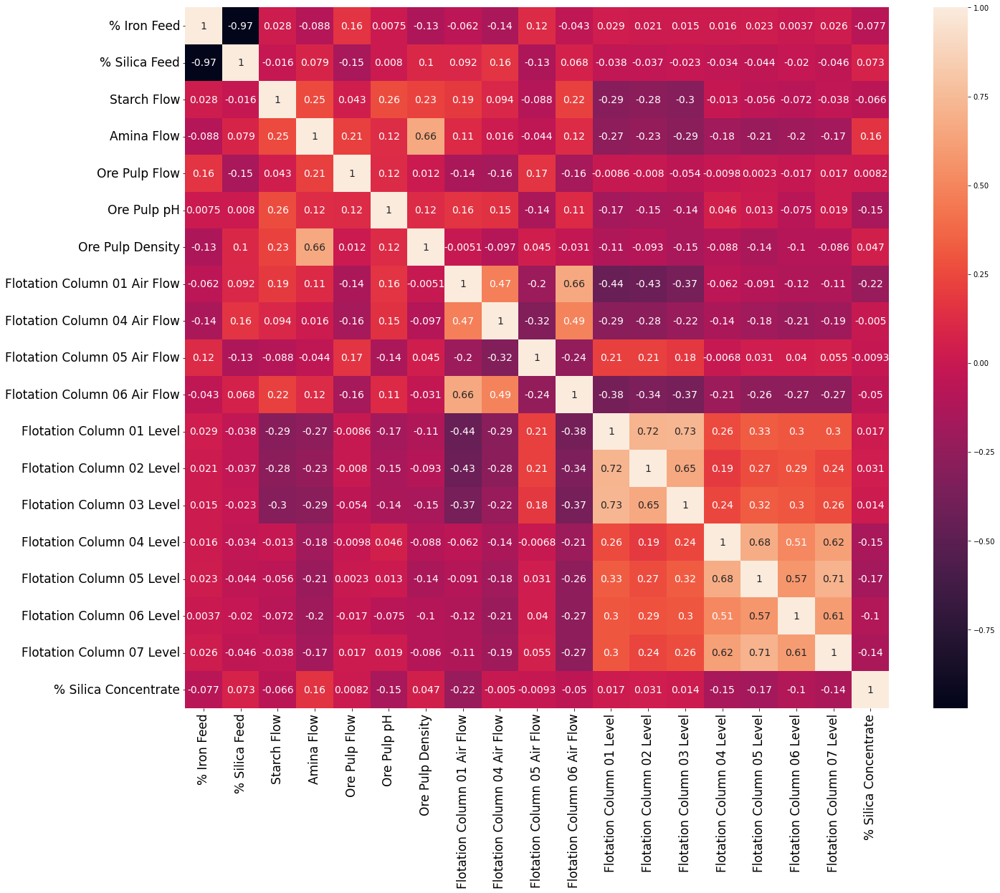

In [95]:
plt.figure(figsize = (22, 18))
sns.heatmap(Data.corr(), annot = True, annot_kws={"size":14})
plt.xticks(fontsize = 17)
plt.yticks(fontsize = 17);

In [353]:
# Data["AminaFLow/OrePulpDensity"] = Data["Amina Flow"]/Data["Ore Pulp Density"]

In [226]:
# Data["OrePulpDensity/AminaFLow"] = Data["Ore Pulp Density"]/Data["Amina Flow"]

In [480]:
Data["OrePulpDensity*AminaFLow"] = Data["Ore Pulp Density"]*Data["Amina Flow"]

In [249]:
Data.drop(columns = "AminaFLow/OrePulpDensity", inplace = True)

In [392]:
Data.drop(columns = "Ore Pulp Density", inplace = True)

In [472]:
Data.drop(columns = "% Iron Feed", inplace = True)

<AxesSubplot:xlabel='OrePulpDensity*AminaFLow', ylabel='% Silica Concentrate'>

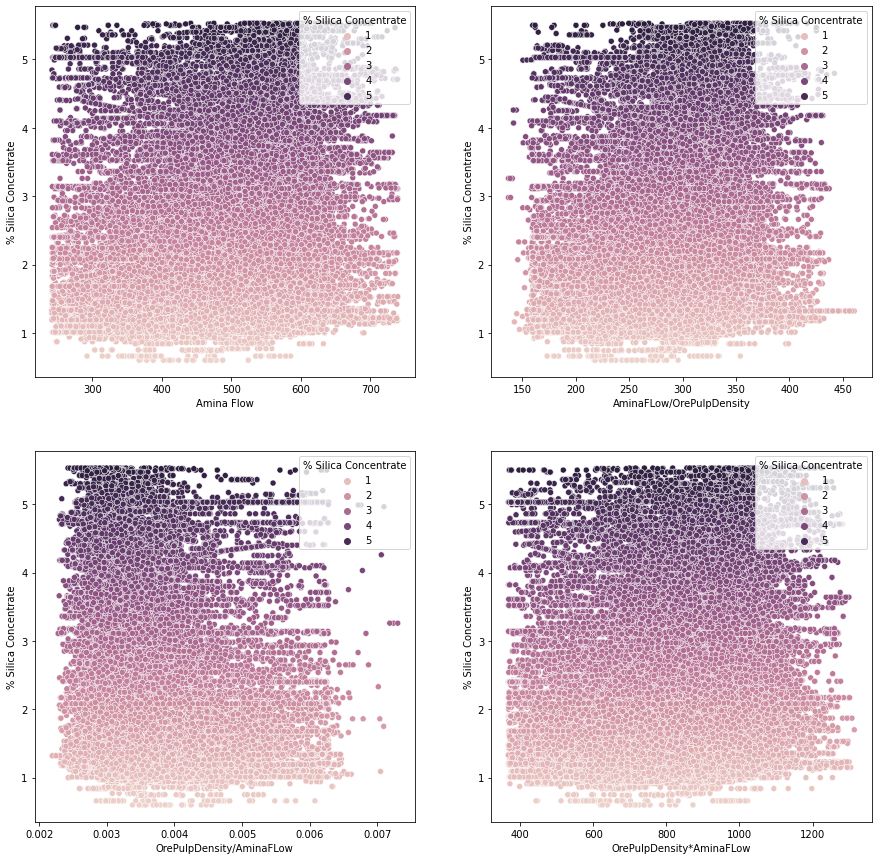

In [174]:
plt.figure(figsize = (15,15))
plt.subplot(2,2,1)
sns.scatterplot(data = Data.sample(90000), x = "Amina Flow", y = "% Silica Concentrate", hue = "% Silica Concentrate")
plt.subplot(2,2,2)
sns.scatterplot(data = Data.sample(90000), x = "AminaFLow/OrePulpDensity", y = "% Silica Concentrate", hue = "% Silica Concentrate")
plt.subplot(2,2,3)
sns.scatterplot(data = Data.sample(90000), x = "OrePulpDensity/AminaFLow", y = "% Silica Concentrate", hue = "% Silica Concentrate")
plt.subplot(2,2,4)
sns.scatterplot(data = Data.sample(90000), x = "OrePulpDensity*AminaFLow", y = "% Silica Concentrate", hue = "% Silica Concentrate")

Text(0, 0.5, 'Ore Pulp Density')

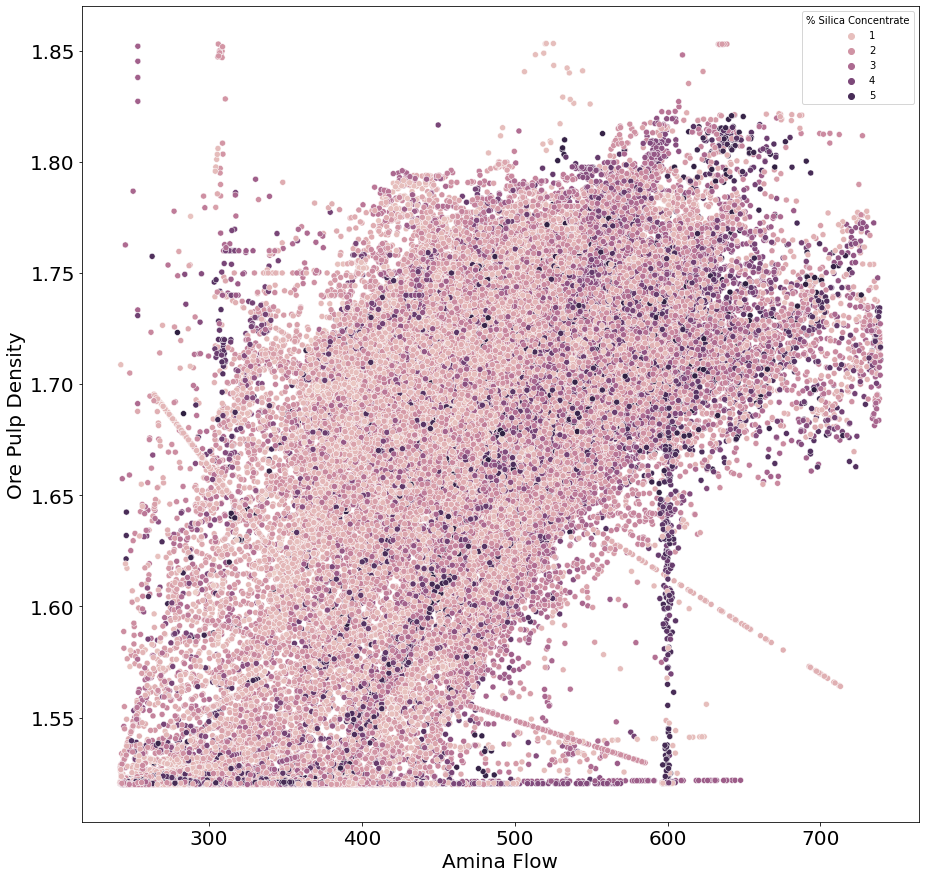

In [99]:
plt.figure(figsize = (15,15))
sns.scatterplot(data = Data.sample(90000), x = "Amina Flow", y = "Ore Pulp Density", hue = "% Silica Concentrate")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("Amina Flow", fontsize = 20)
plt.ylabel("Ore Pulp Density", fontsize = 20)

Text(0, 0.5, '% Silica Concentrate')

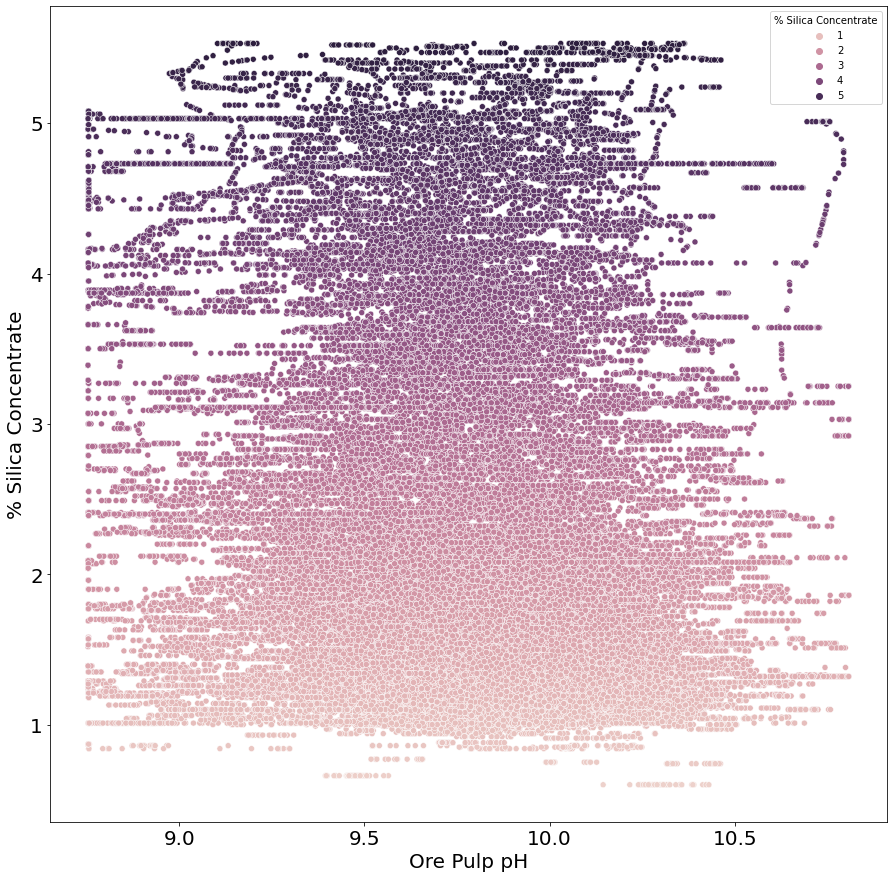

In [104]:
plt.figure(figsize = (15,15))
sns.scatterplot(data = Data.sample(90000), x = "Ore Pulp pH", y = "% Silica Concentrate", hue = "% Silica Concentrate")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("Ore Pulp pH", fontsize = 20)
plt.ylabel("% Silica Concentrate", fontsize = 20)

Text(0, 0.5, '% Silica Concentrate')

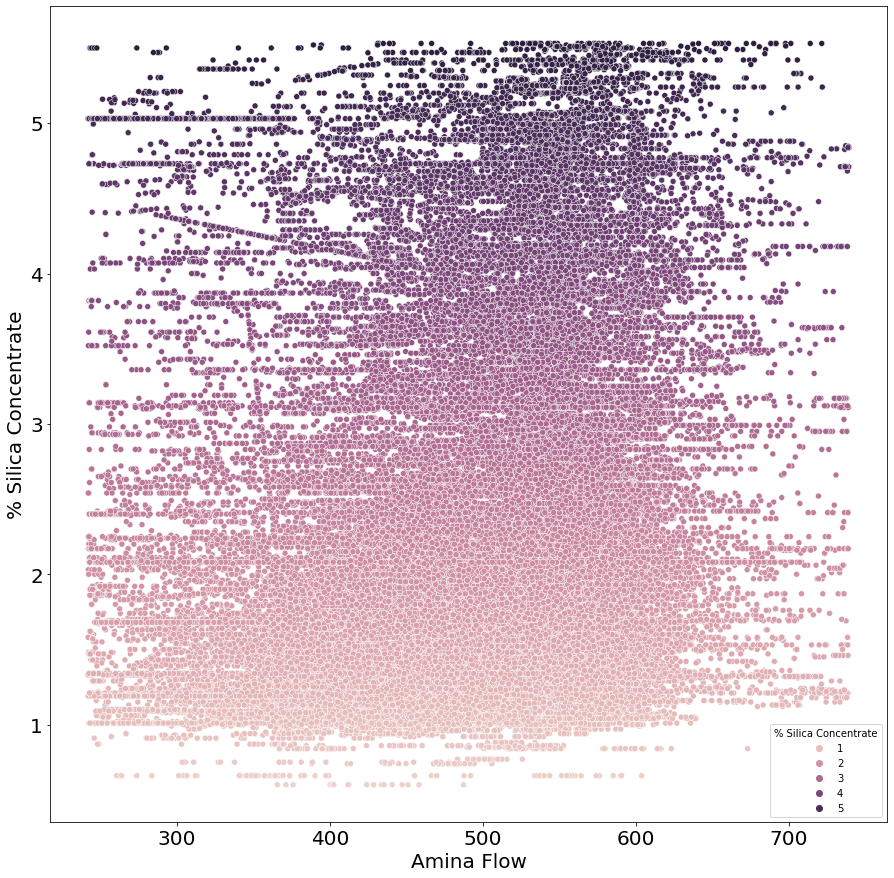

In [106]:
plt.figure(figsize = (15,15))
sns.scatterplot(data = Data.sample(90000), x = "Amina Flow", y = "% Silica Concentrate", hue = "% Silica Concentrate")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel("Amina Flow", fontsize = 20)
plt.ylabel("% Silica Concentrate", fontsize = 20)

In [490]:
Test = Data.sample(frac = 0.2, random_state = 7)
Train = Data.drop(index = Test.index)

In [491]:
Test.to_csv("../data/Test.csv")
Train.to_csv("../data/Train.csv")

In [4]:
train = pd.read_csv("../data/Train.csv", index_col="Unnamed: 0")
test = pd.read_csv("../data/Test.csv", index_col="Unnamed: 0")

In [5]:
xtrain = train.drop(columns = "% Silica Concentrate")
ytrain = train["% Silica Concentrate"]
xtest = test.drop(columns = "% Silica Concentrate")
ytest = test["% Silica Concentrate"]

> ## Regresión lineal

In [186]:
modelo = LinearRegression()
modelo.fit(xtrain, ytrain)

LinearRegression()

In [187]:
modelo.score(xtest, ytest)

0.9999506624158213

In [188]:
print("MAE:", metrics.mean_absolute_error(ytest, modelo.predict(xtest)))
print("MSE:", metrics.mean_squared_error(ytest, modelo.predict(xtest)))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest, modelo.predict(xtest)))
print("RMSE:", np.square(metrics.mean_squared_error(ytest, modelo.predict(xtest))))


MAE: 0.8660788280076407
MSE: 1.4785642487362267
MAPE: 0.0011094472284896857
RMSE: 2.1861522376409224


## Ridge

In [189]:
ridge = Ridge(0.5)
ridge.fit(xtrain, ytrain)

Ridge(alpha=0.5)

In [190]:
print("MAE:", metrics.mean_absolute_error(ytest, ridge.predict(xtest)))
print("MSE:", metrics.mean_squared_error(ytest, ridge.predict(xtest)))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest, ridge.predict(xtest)))
print("RMSE:", np.square(metrics.mean_squared_error(ytest, ridge.predict(xtest))))

MAE: 0.8772754895500845
MSE: 1.4877651573710404
MAPE: 0.0011289662304958777
RMSE: 2.2134451634872767


## Lasso

In [191]:
lasso = Lasso(0.03)
lasso.fit(xtrain, ytrain)

Lasso(alpha=0.03)

In [192]:
print("MAE:", metrics.mean_absolute_error(ytest, lasso.predict(xtest)))
print("MSE:", metrics.mean_squared_error(ytest, lasso.predict(xtest)))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest, lasso.predict(xtest)))
print("RMSE:", np.square(metrics.mean_squared_error(ytest, lasso.predict(xtest))))

MAE: 1.0436306819490777
MSE: 1.8511419367057274
MAPE: 0.0013679207866362296
RMSE: 3.4267264698306312


## ElasticNet

In [193]:
elasticnet = ElasticNet(alpha = 1, l1_ratio = 0.5)
elasticnet.fit(xtrain, ytrain)

ElasticNet(alpha=1)

In [194]:
print("MAE:", metrics.mean_absolute_error(ytest, elasticnet.predict(xtest)))
print("MSE:", metrics.mean_squared_error(ytest, elasticnet.predict(xtest)))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest, elasticnet.predict(xtest)))
print("RMSE:", np.square(metrics.mean_squared_error(ytest, elasticnet.predict(xtest))))

MAE: 1.1140676832291188
MSE: 2.042202366951594
MAPE: 0.0014241678059229738
RMSE: 4.170590507582693


> ## Arbol de decisiones

In [195]:
modelo2 = DecisionTreeRegressor()
modelo2.fit(xtrain, ytrain)

DecisionTreeRegressor()

In [196]:
modelo2.get_depth()

34

In [197]:
modelo2.get_n_leaves()

586546

In [198]:
modelo2.score(xtest, ytest)

0.9999867082302949

In [200]:
print("MAE:", metrics.mean_absolute_error(ytest, modelo2.predict(xtest)))
print("MSE:", metrics.mean_squared_error(ytest, modelo2.predict(xtest)))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest, modelo2.predict(xtest)))
print("RMSE:", np.square(metrics.mean_squared_error(ytest, modelo2.predict(xtest))))


MAE: 0.36651741912070934
MSE: 0.3983319373160169
MAPE: 0.0004669327348142829
RMSE: 0.15866833228593122


> ## RandomForest

In [201]:
modelo3 = RandomForestRegressor(n_estimators=5)
modelo3.fit(xtrain, ytrain)

RandomForestRegressor(n_estimators=5)

In [203]:
print("MAE:", metrics.mean_absolute_error(ytest, modelo3.predict(xtest)))
print("MSE:", metrics.mean_squared_error(ytest, modelo3.predict(xtest)))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest, modelo3.predict(xtest)))
print("RMSE:", np.square(metrics.mean_squared_error(ytest, modelo3.predict(xtest))))


MAE: 0.23564261599112601
MSE: 0.18525315170717463
MAPE: 0.0003012992391871229
RMSE: 0.03431873021744146


In [51]:
modelo3.estimators_[0].get_n_leaves()

93574

## Extra Tree Regressor

In [204]:
modelo4 = ExtraTreesRegressor(n_estimators = 10)
modelo4.fit(xtrain, ytrain)

ExtraTreesRegressor(n_estimators=10)

In [206]:
print("MAE:", metrics.mean_absolute_error(ytest, modelo4.predict(xtest)))
print("MSE:", metrics.mean_squared_error(ytest, modelo4.predict(xtest)))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest, modelo4.predict(xtest)))
print("RMSE:", np.square(metrics.mean_squared_error(ytest, modelo4.predict(xtest))))

MAE: 0.14376704729118014
MSE: 0.07669081627160547
MAPE: 0.0001843146498725302
RMSE: 0.005881481300405146


## KNN


In [207]:
knn = KNeighborsRegressor(n_neighbors=5)
knn.fit(xtrain, ytrain)

KNeighborsRegressor()

In [208]:
print("MAE:", metrics.mean_absolute_error(ytest[:500], knn.predict(pd.DataFrame(xtest)[:500])))
print("MSE:", metrics.mean_squared_error(ytest[:500], knn.predict(pd.DataFrame(xtest)[:500])))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest[:500], knn.predict(pd.DataFrame(xtest)[:500])))
print("RMSE:", np.sqrt(metrics.mean_squared_error(ytest[:500], knn.predict(pd.DataFrame(xtest)[:500]))))

MAE: 16.547487863257082
MSE: 568.0066166013548
MAPE: 0.020618142042443836
RMSE: 23.832889388434523


## SVC con pipeline

In [24]:
pipe = Pipeline(steps=[("st", StandardScaler()), ("model", SVR())])

In [25]:
pipe.fit(xtrain, ytrain)

Pipeline(steps=[('st', StandardScaler()), ('model', SVR())])

In [26]:
print("MAE:", metrics.mean_absolute_error(ytest, pipe.predict(xtest)))
print("MSE:", metrics.mean_squared_error(ytest, pipe.predict(xtest)))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest, pipe.predict(xtest)))
print("RMSE:", np.sqrt(metrics.mean_squared_error(ytest, pipe.predict(xtest))))

MAE: 0.4727508207952606
MSE: 0.5420937169639544
MAPE: 0.21057218164146035
RMSE: 0.7362701385795531


## Randomized Search

> ## Random Forest Regressor("Mejor Modelo")

In [ ]:
RS = RandomizedSearchCV(estimator = modelo3, param_distributions = {"n_estimators": [17, 18, 19, 20, 21, 22],"max_depth": range(79, 82), "min_samples_split": [3,4,5,6]}, verbose=3, n_iter = 20, cv = 2)
RS.fit(xtrain, ytrain)

In [55]:
modelo_final = RS.best_estimator_

In [1]:
RS.best_estimator_

NameError: name 'RS' is not defined

In [27]:
print("MAE:", metrics.mean_absolute_error(ytest, RS.best_estimator_.predict(xtest)))
print("MSE:", metrics.mean_squared_error(ytest, RS.best_estimator_.predict(xtest)))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest, RS.best_estimator_.predict(xtest)))
print("RMSE:", np.square(metrics.mean_squared_error(ytest, RS.best_estimator_.predict(xtest))))

NameError: name 'RS' is not defined

# **Exportanto el Mejor Modelo**

In [443]:
with open("../model/model_" + datetime.now().strftime('%Y%m%d%H%M%S'), 'wb') as f:
    pickle.dump(MODELOFINAL, f)

In [498]:
with open("../model/my_model", 'wb') as f:
    pickle.dump(MODELOFINAL, f)

## Ultimas pruebas

In [81]:
with open('../my_model (5)', 'rb') as f:
    MODELOFINAL = pickle.load(f)

In [95]:
(pd.DataFrame(pd.Series(MODELOFINAL.feature_importances_, index= xtrain.columns))).T


,% Iron Feed,% Silica Feed,Starch Flow,Amina Flow,Ore Pulp Flow,Ore Pulp pH,Ore Pulp Density,Flotation Column 01 Air Flow,Flotation Column 04 Air Flow,Flotation Column 05 Air Flow,Flotation Column 06 Air Flow,Flotation Column 01 Level,Flotation Column 02 Level,Flotation Column 03 Level,Flotation Column 04 Level,Flotation Column 05 Level,Flotation Column 06 Level,Flotation Column 07 Level
0,0.116355,0.119747,0.039864,0.096462,0.017635,0.124617,0.080521,0.059801,0.082227,0.046991,0.023376,0.044658,0.029401,0.050051,0.010134,0.033443,0.016651,0.008063


In [121]:
MODELOFINAL.feature_importances_.max()

0.12461738598318813

In [496]:
MODELOFINAL.fit(xtrain, ytrain)

RandomForestRegressor(max_depth=81, min_samples_split=4, n_estimators=21)

In [109]:
print("MAE:", metrics.mean_absolute_error(ytest, MODELOFINAL.predict(xtest)))
print("MSE:", metrics.mean_squared_error(ytest, MODELOFINAL.predict(xtest)))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest, MODELOFINAL.predict(xtest)))
print("RMSE:", np.square(metrics.mean_squared_error(ytest, MODELOFINAL.predict(xtest))))

MAE: 0.08206113775464972
MSE: 0.043814849816346695
MAPE: 0.040162679322902815
RMSE: 0.001919741064429016


In [9]:
ytrain.unique()

array([1.31      , 1.11      , 1.27      , ..., 3.31032504, 4.1       ,
       3.24      ])

In [10]:
xtrain.columns

Index(['% Iron Feed', '% Silica Feed', 'Starch Flow', 'Amina Flow',
       'Ore Pulp Flow', 'Ore Pulp pH', 'Ore Pulp Density',
       'Flotation Column 01 Air Flow', 'Flotation Column 04 Air Flow',
       'Flotation Column 05 Air Flow', 'Flotation Column 06 Air Flow',
       'Flotation Column 01 Level', 'Flotation Column 02 Level',
       'Flotation Column 03 Level', 'Flotation Column 04 Level',
       'Flotation Column 05 Level', 'Flotation Column 06 Level',
       'Flotation Column 07 Level'],
      dtype='object')

In [ ]:
plt.figure(figsize=(10,10))
sklearn.tree.plot_tree(MODELOFINAL.estimators_[0],
               feature_names=xtrain.columns,
               class_names=ytrain.unique(),
               filled = True);

In [7]:
MODELOFINAL.estimators_[0]

DecisionTreeRegressor(max_depth=81, max_features='auto', min_samples_split=4,
                      random_state=1003883683)

## eliminando iron feed

In [478]:
MODELOFINAL.fit(xtrain, ytrain)

RandomForestRegressor(max_depth=81, min_samples_split=4, n_estimators=21)

In [479]:
print("MAE:", metrics.mean_absolute_error(ytest, MODELOFINAL.predict(xtest)))
print("MSE:", metrics.mean_squared_error(ytest, MODELOFINAL.predict(xtest)))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest, MODELOFINAL.predict(xtest)))
print("RMSE:", np.square(metrics.mean_squared_error(ytest, MODELOFINAL.predict(xtest))))

MAE: 0.08811679369855652
MSE: 0.047617820155830035
MAPE: 0.043209827984474265
RMSE: 0.002267456796392973


## eliminando Iron Feed y añadiendo Amina / Ore pulp

In [485]:
MODELOFINAL.fit(xtrain, ytrain)

RandomForestRegressor(max_depth=81, min_samples_split=4, n_estimators=21)

In [486]:
print("MAE:", metrics.mean_absolute_error(ytest, MODELOFINAL.predict(xtest)))
print("MSE:", metrics.mean_squared_error(ytest, MODELOFINAL.predict(xtest)))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest, MODELOFINAL.predict(xtest)))
print("RMSE:", np.square(metrics.mean_squared_error(ytest, MODELOFINAL.predict(xtest))))

MAE: 0.08798565725263885
MSE: 0.047205545049243035
MAPE: 0.043207296095988536
RMSE: 0.0022283634833961136


## eliminando Iron Feed y Amina y añadiendo Amina / Ore pulp

In [369]:
MODELOFINAL.fit(xtrain, ytrain)

RandomForestRegressor(max_depth=81, min_samples_split=4, n_estimators=21)

In [371]:
print("MAE:", metrics.mean_absolute_error(ytest, MODELOFINAL.predict(xtest)))
print("MSE:", metrics.mean_squared_error(ytest, MODELOFINAL.predict(xtest)))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest, MODELOFINAL.predict(xtest)))
print("RMSE:", np.square(metrics.mean_squared_error(ytest, MODELOFINAL.predict(xtest))))

MAE: 0.01245764667538147
MSE: 0.005306315618986593
MAPE: 0.0061373680110740755
RMSE: 2.8156985448301065e-05


## eliminando Iron Feed y añadiendo Amina * Ore pulp

In [411]:
MODELOFINAL.fit(xtrain, ytrain)

RandomForestRegressor(max_depth=81, min_samples_split=4, n_estimators=21)

In [413]:
print("MAE:", metrics.mean_absolute_error(ytest, MODELOFINAL.predict(xtest)))
print("MSE:", metrics.mean_squared_error(ytest, MODELOFINAL.predict(xtest)))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest, MODELOFINAL.predict(xtest)))
print("RMSE:", np.square(metrics.mean_squared_error(ytest, MODELOFINAL.predict(xtest))))

MAE: 0.011020905562224972
MSE: 0.004559832743924039
MAPE: 0.005400084158131657
RMSE: 2.0792074652561832e-05


## eliminando Iron Feed y Amina y añadiendo Amina * Ore pulp

In [390]:
MODELOFINAL.fit(xtrain, ytrain)

RandomForestRegressor(max_depth=81, min_samples_split=4, n_estimators=21)

In [391]:
print("MAE:", metrics.mean_absolute_error(ytest, MODELOFINAL.predict(xtest)))
print("MSE:", metrics.mean_squared_error(ytest, MODELOFINAL.predict(xtest)))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest, MODELOFINAL.predict(xtest)))
print("RMSE:", np.square(metrics.mean_squared_error(ytest, MODELOFINAL.predict(xtest))))

MAE: 0.011714056413493238
MSE: 0.004663589582856587
MAPE: 0.005765948324213138
RMSE: 2.1749067797328472e-05


## eliminando Iron Feed, Amina y Ore Pulp Density y añadiendo Amina * Ore pulp

In [399]:
MODELOFINAL.fit(xtrain, ytrain)

RandomForestRegressor(max_depth=81, min_samples_split=4, n_estimators=21)

In [ ]:
print("MAE:", metrics.mean_absolute_error(ytest, MODELOFINAL.predict(xtest)))
print("MSE:", metrics.mean_squared_error(ytest, MODELOFINAL.predict(xtest)))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest, MODELOFINAL.predict(xtest)))
print("RMSE:", np.square(metrics.mean_squared_error(ytest, MODELOFINAL.predict(xtest))))

In [5]:
MODELOFINAL.feature_importances_

array([0.12374307, 0.12128313, 0.03950775, 0.09349948, 0.01839595,
       0.12328376, 0.08440109, 0.05924098, 0.08297672, 0.04667539,
       0.02196778, 0.04206228, 0.02989852, 0.04931138, 0.01073288,
       0.02766389, 0.01681616, 0.0085398 ])

In [121]:
print("max_depth:", MODELOFINAL.get_params()["max_depth"])
print("n_estimators:", MODELOFINAL.get_params()["n_estimators"])
print("max_features:", MODELOFINAL.get_params()["max_features"])
print("max_leaf_nodes:", MODELOFINAL.get_params()["max_leaf_nodes"])
print("min_samples_split:", MODELOFINAL.get_params()["min_samples_split"])

max_depth: 81
n_estimators: 21
max_features: auto
max_leaf_nodes: None
min_samples_split: 4


In [116]:
MODELOFINAL.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': 81,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 4,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 21,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

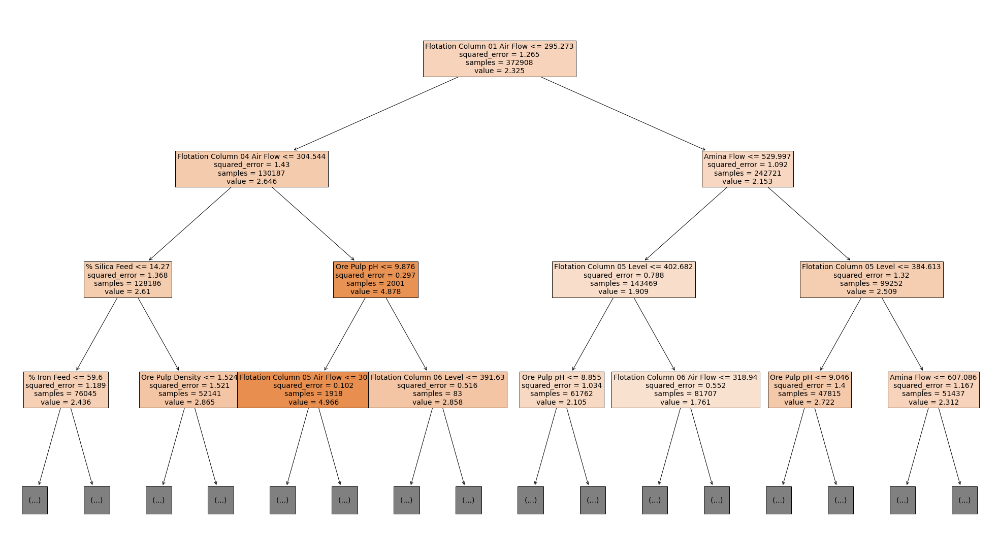

In [108]:
plt.figure(figsize=(35,20))
sklearn.tree.plot_tree(MODELOFINAL.estimators_[0],
                max_depth = 3, 
                feature_names=xtrain.columns,
                filled = True,
                fontsize = 14);

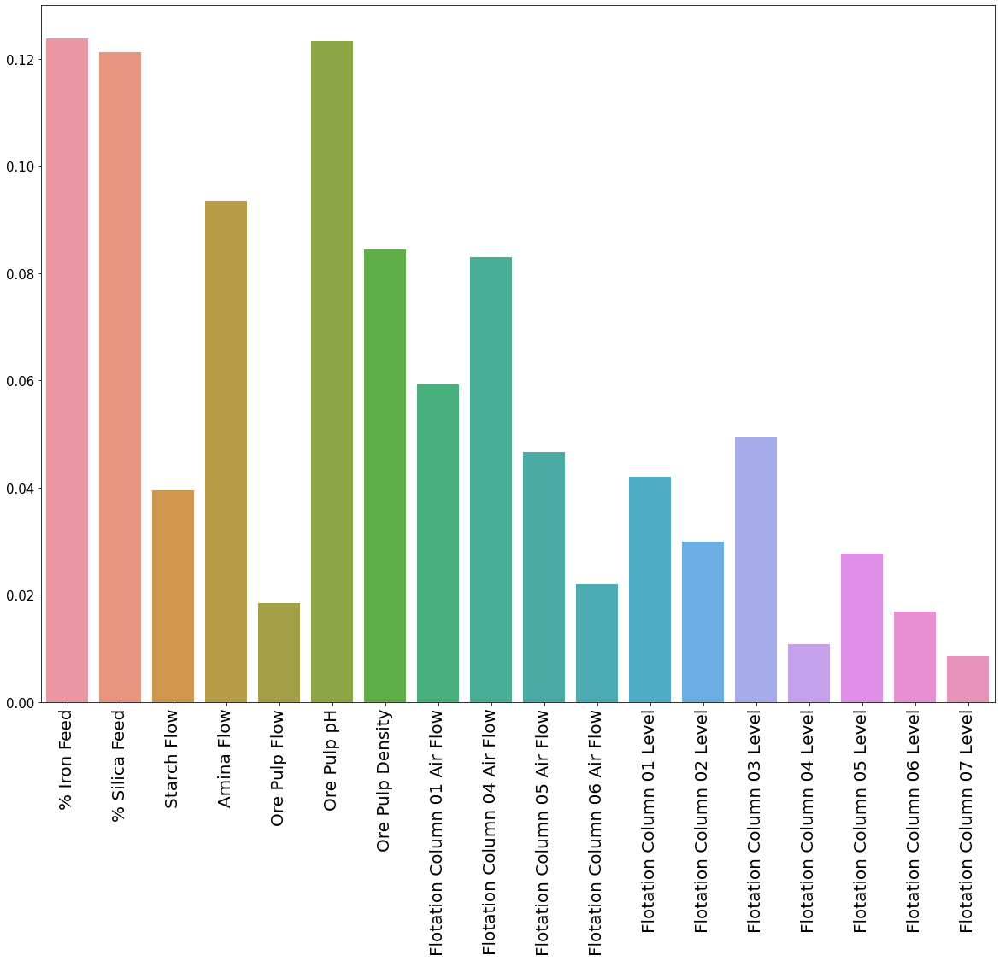

In [37]:
plt.figure(figsize = (20,15))
sns.barplot(x = xtrain.columns, y = MODELOFINAL.feature_importances_)
plt.xticks(rotation = 90, fontsize = 20)
plt.yticks(fontsize = 15);

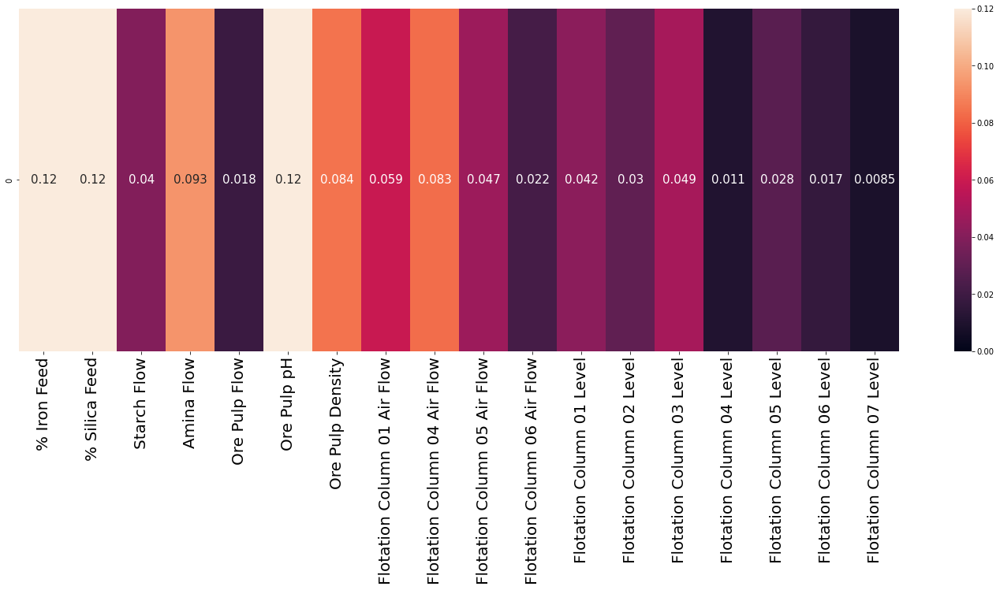

In [86]:
plt.figure(figsize = (25,8))
sns.heatmap((pd.DataFrame(pd.Series(MODELOFINAL.feature_importances_, index= xtrain.columns))).T, annot = True, vmin = 0, vmax = 0.12, annot_kws = {'size':15})
plt.xticks(rotation = 90, fontsize = 20);

In [24]:
xtest.iloc[:1]

,% Iron Feed,% Silica Feed,Starch Flow,Amina Flow,Ore Pulp Flow,Ore Pulp pH,Ore Pulp Density,Flotation Column 01 Air Flow,Flotation Column 04 Air Flow,Flotation Column 05 Air Flow,Flotation Column 06 Air Flow,Flotation Column 01 Level,Flotation Column 02 Level,Flotation Column 03 Level,Flotation Column 04 Level,Flotation Column 05 Level,Flotation Column 06 Level,Flotation Column 07 Level
444267,55.69,15.18,3107.5,540.543,398.895,9.99106,1.65575,299.844,299.844,299.171,293.089,395.888,355.916,394.007,402.418,389.953,396.66,422.302


In [37]:
ytest.sample(100, random_state=4)

71088    1.84
Name: % Silica Concentrate, dtype: float64

In [36]:
MODELOFINAL.predict(xtest.sample(100, random_state = 4))

array([1.83809524])

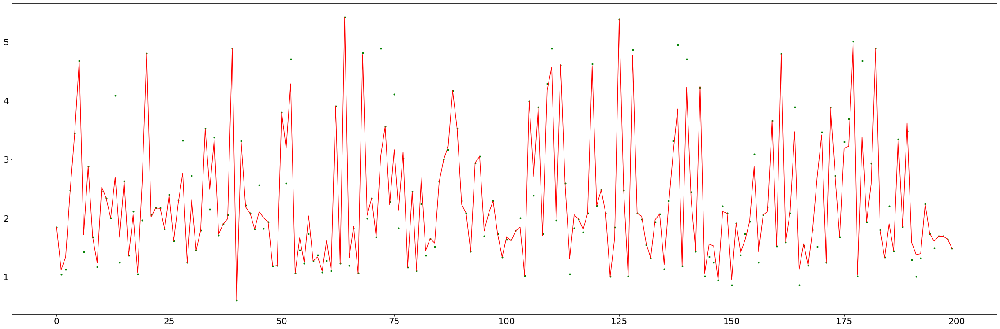

In [80]:
plt.figure(figsize = (40,13))
plt.plot(range(200), ytest.sample(200, random_state=4), "g.")
plt.plot(range(200), MODELOFINAL.predict(xtest.sample(200, random_state = 4)), "r-")
plt.xticks(fontsize = 20);
plt.yticks(fontsize = 20);

## GridSearch

> ### Random Forest Regressor

In [ ]:
GS = GridSearchCV(estimator = modelo3, param_grid = {"n_estimators": [3,5,7,9,11,13],"max_depth": range(80, 86), "min_samples_split": [1,2,3,4,5,6,7,8], "max_leaf_nodes": [59545,60000, 70000, 80000,97189]}, verbose=1.1)
GS.fit(xtrain, ytrain)

In [ ]:
GS.best_estimator_

In [ ]:
print("MAE:", metrics.mean_absolute_error(ytest, GS.best_estimator_.predict(xtest)))
print("MSE:", metrics.mean_squared_error(ytest, GS.best_estimator_.predict(xtest)))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest, GS.best_estimator_.predict(xtest)))
print("RMSE:", np.sqrt(metrics.mean_squared_error(ytest, GS.best_estimator_.predict(xtest))))

> ### Decission Tree Regressor

In [ ]:
GS2 = GridSearchCV(estimator = modelo2, param_grid = {"max_depth": range(79, 86), "min_samples_split": [2,3,4,5,6,7,8], "max_leaf_nodes": [40000, 59545,60000, 70000, 80000]}, verbose = 1.1)
GS2.fit(xtrain, ytrain)

In [265]:
GS2.best_estimator_

DecisionTreeRegressor(max_depth=81, max_leaf_nodes=59545, min_samples_split=5)

In [ ]:
print("MAE:", metrics.mean_absolute_error(ytest, GS2.best_estimator_.predict(xtest)))
print("MSE:", metrics.mean_squared_error(ytest, GS2.best_estimator_.predict(xtest)))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest, GS2.best_estimator_.predict(xtest)))
print("RMSE:", np.sqrt(metrics.mean_squared_error(ytest, GS2.best_estimator_.predict(xtest))))

> ### Extra Tree Regressor

In [ ]:
GS3 = GridSearchCV(estimator = modelo4, param_grid = {"max_depth": range(79, 86), "min_samples_split": [2,3,4,5,6,7,8], "max_leaf_nodes": [40000, 59545,60000, 70000, 80000]}, verbose = 1.1)
GS3.fit(xtrain, ytrain)

In [45]:
GS3.best_estimator_

ExtraTreesRegressor(max_depth=82, max_leaf_nodes=60000, n_estimators=5)

In [ ]:
print("MAE:", metrics.mean_absolute_error(ytest, GS3.best_estimator_.predict(xtest)))
print("MSE:", metrics.mean_squared_error(ytest, GS3.best_estimator_.predict(xtest)))
print("MAPE:", metrics.mean_absolute_percentage_error(ytest, GS3.best_estimator_.predict(xtest)))
print("RMSE:", np.sqrt(metrics.mean_squared_error(ytest, GS3.best_estimator_.predict(xtest))))

In [51]:
GS3.best_estimator_.feature_importances_

array([0.04001901, 0.03516672, 0.00901529, 0.01980833, 0.01041696,
       0.02436674, 0.01560818, 0.03694824, 0.02005219, 0.00968847,
       0.00978662, 0.01346624, 0.01017906, 0.01857041, 0.01079596,
       0.00709242, 0.00564517, 0.00578489, 0.69758911])